## Web Voyager

[WebVoyager](https://arxiv.org/abs/2401.13919) by He, et. al., is a vision-enabled web-browsing agent capable of controlling the mouse and keyboard.

It works by viewing annotated browser screenshots for each turn, then choosing the next step to take. The agent architecture is a basic reasoning and action (ReAct) loop. 
The unique aspects of this agent are:
- It's usage of [Set-of-Marks](https://som-gpt4v.github.io/)-like image annotations to serve as UI affordances for the agent
- It's application in the browser by using tools to control both the mouse and keyboard

The overall design looks like the following:

<!-- ![Voyager Image](./img/web-voyager.excalidraw.png) -->
<img src="./img/web-voyager.excalidraw.png" width="50%">


## Configure environment

We will first set up LangSmith tracing. Though optional, this lets us inspect and debug agent's trajectory for a given input.

You can sign up at [smith.langchain.com](https://smith.langchain.com/) to get an API key.

In [1]:
%%capture --no-stderr
%pip install -U --quiet langchain langgraph langsmith langchain_openai

In [2]:
# Optional: add tracing to visualize the agent trajectories
import os
from getpass import getpass


def _getpass(env_var: str):
    if not os.environ.get(env_var):
        os.environ[env_var] = getpass(f"{env_var}=")


os.environ["LANGCHAIN_TRACING_V2"] = "true"
os.environ["LANGCHAIN_PROJECT"] = "Web-Voyager"
os.environ["LANGCHAIN_API_KEY"] = ""
os.environ["OPENAI_API_KEY"] = ''

#### Install Agent requirements

The only additional requirement we have is the [playwright](https://playwright.dev/) browser. Uncomment and install below:

In [3]:
%pip install --upgrade --quiet  playwright > /dev/null
!playwright install

Note: you may need to restart the kernel to use updated packages.


In [4]:
import nest_asyncio

# This is just required for running async playwright in a Jupyter notebook
nest_asyncio.apply()

## Define Graph State

The state provides the inputs to each node in the graph.

In our case, the agent will track the webpage object (within the browser), annotated images + bounding boxes, the user's initial request, and the messages containing the agent scratchpad, system prompt, and other information.


In [5]:
from typing import List, Optional, TypedDict

from langchain_core.messages import BaseMessage, SystemMessage
from playwright.async_api import Page


class BBox(TypedDict):
    x: float
    y: float
    text: str
    type: str
    ariaLabel: str


class Prediction(TypedDict):
    action: str
    args: Optional[List[str]]


# This represents the state of the agent
# as it proceeds through execution
class AgentState(TypedDict):
    page: Page  # The Playwright web page lets us interact with the web environment
    input: str  # User request
    img: str  # b64 encoded screenshot
    bboxes: List[BBox]  # The bounding boxes from the browser annotation function
    prediction: Prediction  # The Agent's output
    # A system message (or messages) containing the intermediate steps
    scratchpad: List[BaseMessage]
    observation: str  # The most recent response from a tool

## Define tools

The agent has 6 simple tools:

1. Click (at labeled box)
2. Type
3. Scroll
4. Wait
5. Go back
6. Go to search engine (Google)


We define them below here as functions:

In [6]:
import asyncio
import platform


async def click(state: AgentState):
    # - Click [Numerical_Label]
    page = state["page"]
    click_args = state["prediction"]["args"]
    if click_args is None or len(click_args) != 1:
        return f"Failed to click bounding box labeled as number {click_args}"
    bbox_id = click_args[0]
    bbox_id = int(bbox_id)
    try:
        bbox = state["bboxes"][bbox_id]
    except Exception:
        return f"Error: no bbox for : {bbox_id}"
    x, y = bbox["x"], bbox["y"]
    await page.mouse.click(x, y)
    # TODO: In the paper, they automatically parse any downloaded PDFs
    # We could add something similar here as well and generally
    # improve response format.
    return f"Clicked {bbox_id}"


async def type_text(state: AgentState):
    page = state["page"]
    type_args = state["prediction"]["args"]
    if type_args is None or len(type_args) != 2:
        return (
            f"Failed to type in element from bounding box labeled as number {type_args}"
        )
    bbox_id = type_args[0]
    bbox_id = int(bbox_id)
    bbox = state["bboxes"][bbox_id]
    x, y = bbox["x"], bbox["y"]
    text_content = type_args[1]
    await page.mouse.click(x, y)
    # Check if MacOS
    select_all = "Meta+A" if platform.system() == "Darwin" else "Control+A"
    await page.keyboard.press(select_all)
    await page.keyboard.press("Backspace")
    await page.keyboard.type(text_content)
    await page.keyboard.press("Enter")
    return f"Typed {text_content} and submitted"


async def scroll(state: AgentState):
    page = state["page"]
    scroll_args = state["prediction"]["args"]
    if scroll_args is None or len(scroll_args) != 2:
        return "Failed to scroll due to incorrect arguments."

    target, direction = scroll_args

    if target.upper() == "WINDOW":
        # Not sure the best value for this:
        scroll_amount = 500
        scroll_direction = (
            -scroll_amount if direction.lower() == "up" else scroll_amount
        )
        await page.evaluate(f"window.scrollBy(0, {scroll_direction})")
    else:
        # Scrolling within a specific element
        scroll_amount = 200
        target_id = int(target)
        bbox = state["bboxes"][target_id]
        x, y = bbox["x"], bbox["y"]
        scroll_direction = (
            -scroll_amount if direction.lower() == "up" else scroll_amount
        )
        await page.mouse.move(x, y)
        await page.mouse.wheel(0, scroll_direction)

    return f"Scrolled {direction} in {'window' if target.upper() == 'WINDOW' else 'element'}"


async def wait(state: AgentState):
    sleep_time = 5
    await asyncio.sleep(sleep_time)
    return f"Waited for {sleep_time}s."


async def go_back(state: AgentState):
    page = state["page"]
    await page.go_back()
    return f"Navigated back a page to {page.url}."


async def to_google(state: AgentState):
    page = state["page"]
    await page.goto("https://www.google.com/")
    return "Navigated to google.com."

## Define Agent

The agent is driven by a multi-modal model and decides the action to take for each step. It is composed of a few runnable objects:

1. A `mark_page` function to annotate the current page with bounding boxes
2. A prompt to hold the user question, annotated image, and agent scratchpad
3. GPT-4V to decide the next steps
4. Parsing logic to extract the action


Let's first define the annotation step:
#### Browser Annotations

This function annotates all buttons, inputs, text areas, etc. with numbered bounding boxes. GPT-4V then just has to refer to a bounding box
when taking actions, reducing the complexity of the overall task.

In [7]:
import base64

from langchain_core.runnables import chain as chain_decorator

# Some javascript we will run on each step
# to take a screenshot of the page, select the
# elements to annotate, and add bounding boxes
with open("mark_page.js") as f:
    mark_page_script = f.read()


@chain_decorator
async def mark_page(page):
    await page.evaluate(mark_page_script)
    for _ in range(10):
        try:
            bboxes = await page.evaluate("markPage()")
            break
        except Exception:
            # May be loading...
            asyncio.sleep(3)
    screenshot = await page.screenshot()
    # Ensure the bboxes don't follow us around
    await page.evaluate("unmarkPage()")
    return {
        "img": base64.b64encode(screenshot).decode(),
        "bboxes": bboxes,
    }

#### Agent definition

Now we'll compose this function with the prompt, llm and output parser to complete our agent.

In [8]:
from langchain import hub
from langchain_core.output_parsers import StrOutputParser
from langchain_core.runnables import RunnablePassthrough
from langchain_openai import ChatOpenAI


async def annotate(state):
    marked_page = await mark_page.with_retry().ainvoke(state["page"])
    return {**state, **marked_page}


def format_descriptions(state):
    labels = []
    for i, bbox in enumerate(state["bboxes"]):
        text = bbox.get("ariaLabel") or ""
        if not text.strip():
            text = bbox["text"]
        el_type = bbox.get("type")
        labels.append(f'{i} (<{el_type}/>): "{text}"')
    bbox_descriptions = "\nValid Bounding Boxes:\n" + "\n".join(labels)
    return {**state, "bbox_descriptions": bbox_descriptions}


def parse(text: str) -> dict:
    action_prefix = "Action: "
    if not text.strip().split("\n")[-1].startswith(action_prefix):
        return {"action": "retry", "args": f"Could not parse LLM Output: {text}"}
    action_block = text.strip().split("\n")[-1]

    action_str = action_block[len(action_prefix) :]
    split_output = action_str.split(" ", 1)
    if len(split_output) == 1:
        action, action_input = split_output[0], None
    else:
        action, action_input = split_output
    action = action.strip()
    if action_input is not None:
        action_input = [
            inp.strip().strip("[]") for inp in action_input.strip().split(";")
        ]
    return {"action": action, "args": action_input}


# Will need a later version of langchain to pull
# this image prompt template
prompt = hub.pull("wfh/web-voyager")

/usr/local/lib/python3.10/dist-packages/langsmith/client.py:5515: LangChainBetaWarning: The function `loads` is in beta. It is actively being worked on, so the API may change.
  prompt = loads(json.dumps(prompt_object.manifest))


In [9]:
# !pip install langchain_openai

In [22]:
llm = ChatOpenAI(model="gpt-4o", max_tokens=4096)
agent = annotate | RunnablePassthrough.assign(
    prediction=format_descriptions | prompt | llm | StrOutputParser() | parse
)

## Define graph

We've created most of the important logic. We have one more function to define that will help us update the graph state after a tool is called.

In [23]:
import re


def update_scratchpad(state: AgentState):
    """After a tool is invoked, we want to update
    the scratchpad so the agent is aware of its previous steps"""
    old = state.get("scratchpad")
    if old:
        txt = old[0].content
        last_line = txt.rsplit("\n", 1)[-1]
        step = int(re.match(r"\d+", last_line).group()) + 1
    else:
        txt = "Previous action observations:\n"
        step = 1
    txt += f"\n{step}. {state['observation']}"

    return {**state, "scratchpad": [SystemMessage(content=txt)]}

Now we can compose everything into a graph:

In [24]:
from langchain_core.runnables import RunnableLambda

from langgraph.graph import END, START, StateGraph

graph_builder = StateGraph(AgentState)


graph_builder.add_node("agent", agent)
graph_builder.add_edge(START, "agent")

graph_builder.add_node("update_scratchpad", update_scratchpad)
graph_builder.add_edge("update_scratchpad", "agent")

tools = {
    "Click": click,
    "Type": type_text,
    "Scroll": scroll,
    "Wait": wait,
    "GoBack": go_back,
    "Google": to_google,
}


for node_name, tool in tools.items():
    graph_builder.add_node(
        node_name,
        # The lambda ensures the function's string output is mapped to the "observation"
        # key in the AgentState
        RunnableLambda(tool) | (lambda observation: {"observation": observation}),
    )
    # Always return to the agent (by means of the update-scratchpad node)
    graph_builder.add_edge(node_name, "update_scratchpad")


def select_tool(state: AgentState):
    # Any time the agent completes, this function
    # is called to route the output to a tool or
    # to the end user.
    action = state["prediction"]["action"]
    if action == "ANSWER":
        return END
    if action == "retry":
        return "agent"
    return action


graph_builder.add_conditional_edges("agent", select_tool)

graph = graph_builder.compile()

## Run agent

Now that we've created the whole agent executor, we can run it on a few questions! We'll start our browser at "google.com" and then let it control the rest.

Below is a helper function to help print out the steps to the notebook (and display the intermediate screenshots).

In [41]:
from IPython import display
from playwright.async_api import async_playwright

browser = await async_playwright().start()
# We will set headless=False so we can watch the agent navigate the web.
browser = await browser.chromium.launch(headless=True, args=None)
page = await browser.new_page()
_ = await page.goto("https://www.google.com")


async def call_agent(question: str, page, max_steps: int = 150):
    event_stream = graph.astream(
        {
            "page": page,
            "input": question,
            "scratchpad": [],
        },
        {
            "recursion_limit": max_steps,
        },
    )
    imgs = []
    final_answer = None
    steps = []
    async for event in event_stream:
        # We'll display an event stream here
        if "agent" not in event:
            continue
        pred = event["agent"].get("prediction") or {}
        action = pred.get("action")
        action_input = pred.get("args")
        display.clear_output(wait=False)
        steps.append(f"{len(steps) + 1}. {action}: {action_input}")
        print("\n".join(steps))
        display.display(display.Image(base64.b64decode(event["agent"]["img"])))
        imgs.append(base64.b64decode(event["agent"]["img"]))
        if "ANSWER" in action:
            final_answer = action_input[0]
            break
    return final_answer, imgs

1. Click: ['9']
2. Type: ['9', 'WebVoyager paper site:arxiv.org']
3. Click: ['18']
4. Click: ['28']
5. retry: Could not parse LLM Output: Thought: The paper titled "WebVoyager: Building an End-to-End Web Agent with Large Multimodal Models" is accessible from the arXiv page. I will provide a summary based on the abstract and main content visible.

The rapid advancement of large language models (LLMs) has led to the development of autonomous applications in real-world scenarios, driving innovation in creating advanced web agents. Current web agents typically handle only one input modality and are evaluated in simple web simulators, limiting their real-world applicability. To address this, the authors introduce WebVoyager, an innovative Large Multimodal Model (LMM) powered web agent capable of completing user instructions end-to-end by interacting with real-world websites.

Key points from the paper:
1. **Innovation**: WebVoyager integrates multiple input modalities and operates in real-w

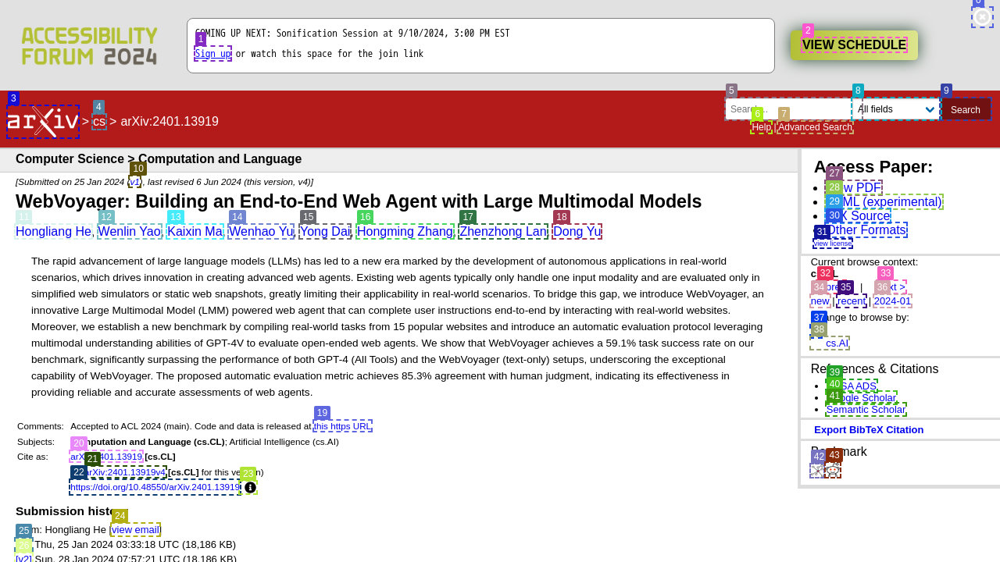

Final response: The paper titled "WebVoyager: Building an End-to-End Web Agent with Large Multimodal Models" discusses the development of an autonomous web agent called WebVoyager. This agent leverages large multimodal models (LMMs) to handle real-world web tasks, addressing the limitations of existing web agents that typically handle only one input modality and are confined to simplified simulations or static snapshots. WebVoyager is designed to complete user instructions end-to-end by interacting with real websites and introduces a new benchmark for evaluating open-ended web agents. The study reports that WebVoyager achieves a 59.1% task success rate and 85.3% agreement with human judgment, outperforming the capabilities of GPT-4V (All Tools) and text-only setups.


In [26]:
res = await call_agent("Could you explain the WebVoyager paper (on arxiv)?", page)
print(f"Final response: {res}")

1. Type: ['8', "today's XKCD comic"]
2. Click: ['18']
3. Click: ['19']
4. ANSWER;: ['The humor in today\'s XKCD comic "Transformers" comes from the unexpected transformation of the robot character. Instead of transforming into a vehicle or another form as typical Transformers do, the character humorously transforms into a cocoon, which is an amusingly surprising and mundane outcome for a robot.']


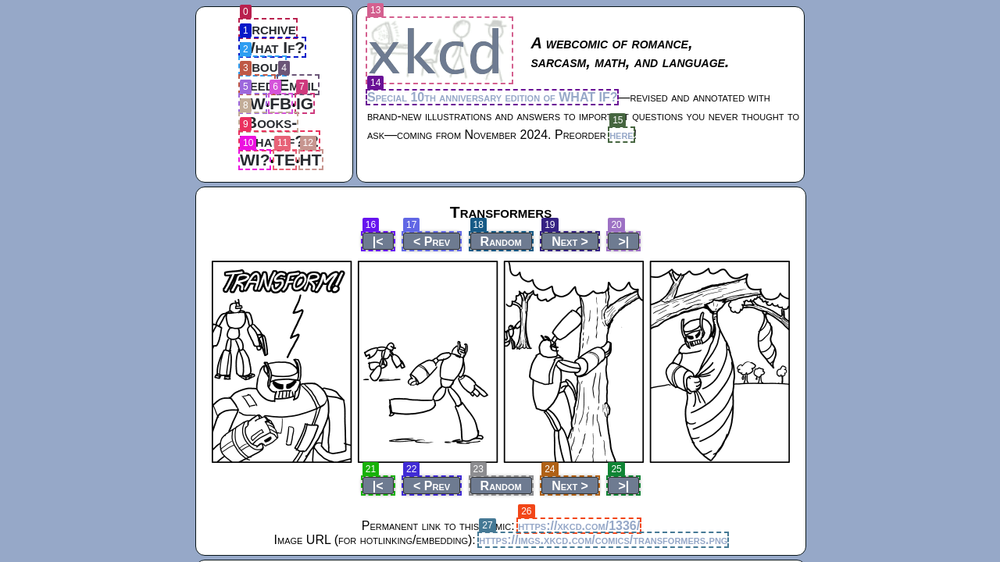

Final response: The humor in today's XKCD comic "Transformers" comes from the unexpected transformation of the robot character. Instead of transforming into a vehicle or another form as typical Transformers do, the character humorously transforms into a cocoon, which is an amusingly surprising and mundane outcome for a robot.


In [29]:
res = await call_agent(
    "Please explain the today's XKCD comic for me. Why is it funny?", page
)
print(f"Final response: {res}")

In [ ]:
res = await call_agent("What are the latest blog posts from langchain?", page)
print(f"Final response: {res}")

1. Click: ['9']
2. Type: ['9', 'SF downtown to SFO directions']
3. Click: ['34']
4. Click: ['0']
5. Click: ['54']
6. Click: ['0']
7. Click: ['7']
8. ANSWER;: ["The travel time from Financial District, San Francisco to San Francisco International Airport is approximately 18 minutes. To arrive by 7 o'clock, you should leave around 6:42 PM to account for travel and a few extra minutes for any delays."]


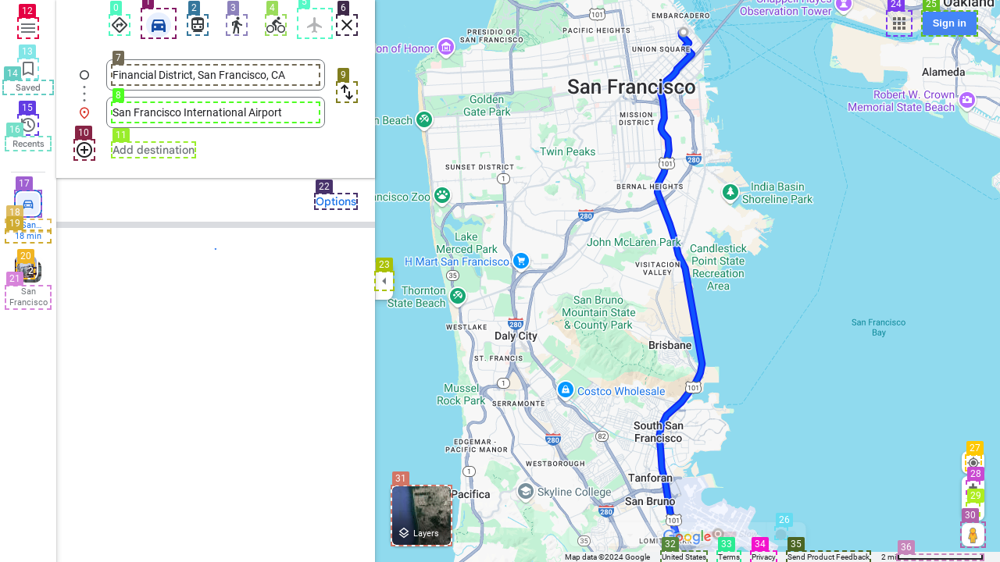

Final response: The travel time from Financial District, San Francisco to San Francisco International Airport is approximately 18 minutes. To arrive by 7 o'clock, you should leave around 6:42 PM to account for travel and a few extra minutes for any delays.


In [42]:
res, imgs = await call_agent(
    "Could you check google maps to see when i should leave to get to SFO by 7 o'clock? starting from SF downtown.",
    page,
)
print(f"Final response: {res}")

In [45]:
imgs

[b'\x89PNG\r\n\x1a\n\x00\x00\x00\rIHDR\x00\x00\x05\x00\x00\x00\x02\xd0\x08\x02\x00\x00\x00@\x1fJ\x01\x00\x00\x00\x01sRGB\x00\xae\xce\x1c\xe9\x00\x00 \x00IDATx\x9c\xec\xddg|T\xc5\xda\x00\xf0g\xe6\x9c\xb35\x9b\xde\x1b\t\x01B\x00)"\xd2\x05\x0b*"v\x11\xe5*\x8a\xe8U\xae\x15\xcb\x15T\xf4b\xc5\n\xd7vE\x85k\x05\xaf\xa2\xaf\xa8(\x82\x8a"%\x10zK\x08)\xa4\x90^v\x93\xad\xe7\x9c\x99\xf7\xc3\t\xcb&\x84\x10\xc8&\x1b\xf4\xf9\xff\xfc0;3;\xe7\xc9\x067\xfb\xec\xcc\x99!\x9cs\xe8\x00%\xe3\xde\xf6w\x16\x0f\xbc\xd1\x91ku\xd0\x86\xa2_\xda\xd9st\xf2\x05\x9d\x1c\x0bB\x08!\x84\x10B\xfeq\xd5\x83\xaf\xda]\xee\xf6\xf4\xb4\x98\x8d_\xbd\xf2`\xe7G\x04}\x9d\x174\x80\xbd==\xc3 x\xafqM\xe7G\xd4\x96\xba\xaa\x10\xdf\x87\x96\xd0\x95N\xfbk\x8a\xbc.8|s\xa3\xf5f\xa6\xe6\xfa\xb6\x86EY\xbb<@\x90\x1e\x9e\xd4j\xbdH\x05\xeb\x0b_\xf5z\xee\xb62[\xad\xb7R~\xe5\xfb.\x0c\xed\xccC\x03\x1d\x00B\x08!\x84\x10B\xe8\xf4\xb53\xfb\x05\x80\x06\xbb\xb3\x93c9z\xa1\xf6e\xbf\x00P\x07\xb6N\x8e\xe5\xd4\xe8\x0c72V\xa1\xc8\xeb\x02\x1d\xc8\t\xc5Z\xc22b\x

In [49]:
!pip install pillow

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 5.8 MB/s eta 0:00:0000:0100:01


In [50]:
from PIL import Image
from io import BytesIO

# Function to decode base64 string and save it as PNG
def save_base64_image(base64_str, filename):
    # Remove the "data:image/png;base64," part if present
    # if base64_str.startswith('data:image'):
    #     base64_str = base64_str.split(',')[1]

    # image_data = base64.b64decode(base64_str)
    image = Image.open(BytesIO(base64_str))
    image.save(filename)

# Loop through base64 images and save them
for idx, base64_image in enumerate(imgs):
    save_base64_image(base64_image, f'imgs/image_{idx}.png')

1. Click: ['9']
2. Click: ['9']
3. Type: ['9', 'latest news about AI affecting stock markets']
4. Click: ['22']
5. Click: ['22']
6. Click: ['23']
7. Click: ['23']
8. Click: ['23']
9. Click: ['23']
10. Click: ['23']
11. Click: ['23']
12. Click: ['23']
13. Click: ['23']
14. Click: ['23']
15. Click: ['23']
16. Click: ['23']
17. Click: ['23']
18. Click: ['23']
19. Click: ['23']
20. Click: ['23']
21. Click: ['23']
22. Click: ['23']
23. Click: ['24']
24. Click: ['23']
25. Click: ['23']
26. Click: ['23']
27. Click: ['23']
28. ANSWER;: ['The latest news about AI that could affect the stock markets is in the article titled "Here\'s How an Interest Rate Cut Could Affect Artificial Intelligence (AI) Stocks" by Justin Pope from The Motley Fool. Source URL: [Insert the URL from the webpage here']


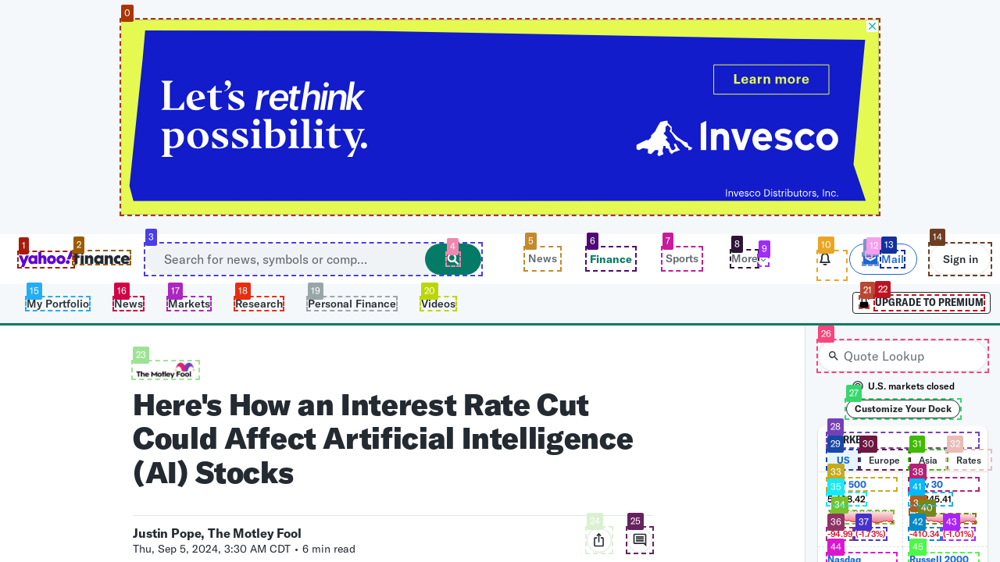

Final response: The latest news about AI that could affect the stock markets is in the article titled "Here's How an Interest Rate Cut Could Affect Artificial Intelligence (AI) Stocks" by Justin Pope from The Motley Fool. Source URL: [Insert the URL from the webpage here


In [40]:
res = await call_agent(
    "What is the latest new about AI that could affect the stock markets? Provide the source URL.",
    page,
)
print(f"Final response: {res}")